# Проектная работа
## ___«Рынок заведений общественного питания Москвы»___

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и __открыть заведение общественного питания в Москве__. Необходимо __подготовить исследование рынка Москвы__, __найти интересные особенности__ и __презентовать полученные результаты__, которые в будущем помогут в выборе подходящего инвесторам места.

## 1. Подключение библиотек и выгрузка исходных данных

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import plotly.express as px
# импортируем карту,хороплет, маркер и кластер
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

In [2]:
# Координаты центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

In [3]:
data_i = pd.read_csv('/datasets/moscow_places.csv')
data = data_i.copy()

## 2. Предобработка данных

### 2.1. Общая информация о датасете
Имеются нулевые значения в:
- __hours__ - информация о днях и часах работы
- __price__ - категория цен в заведении
- __avg_bill__ - средняя стоимость заказа 
- __middle_avg_bill__ - число с оценкой среднего чека
- __middle_coffee_cup__ - число с оценкой одной чашки капучино
- __seats__ - количество посадочных мест

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [5]:
data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


### 2.2. Обработка пропусков

#### 2.2.1. hours 
Нет возможности логической замены  
Поставим заглушку: __"Неизвестно"__

In [6]:
data['hours'] = data['hours'].fillna('Неизвестно')

#### 2.2.2. price 
Если пропуски имеются также в ___avg_bill и  middle_avg_bill и middle_coffee_cup___  
То ставим заглушку: __"Неизвестно"__

Если известна сумма среднего чека или чашечки кофе, то разделяем по категориям и заполняем пропуски

In [7]:
def price_nan(row):
    # Категория известна
    if pd.notnull(row['price']):
        return(row['price'])
    #Категория неизвестна, но есть сумма среднего чека
    else:
        if pd.notnull(row['middle_avg_bill']):
            return(avg_price_category(row['middle_avg_bill']))
        #Категория неизвестна, но есть сумма кофе
        else:
            if pd.notnull(row['middle_coffee_cup']):
                return(avg_price_category(row['middle_coffee_cup']))
            #Ничего неизвестно
            else:
                return('Неизвестно')
#  Категории порядка цен на основе среднего чека       
def avg_price_category(price):
    if price < 500:
        return('низкие')
    if price >=500 and price <= 1000:
        return('средние')
    if price > 1000 and price <= 1800:
        return('выше среднего')
    else:
        return('высокие')
#  Категории порядка цен на основе стоимости чашки кофе  
def cup_price_category(price):
    if price < 150:
        return('низкие')
    if price >=150 and price <= 250:
        return('средние')
    if price > 250 and price <= 350:
        return('выше среднего')
    else:
        return('высокие')

In [8]:
data['price'] = data.apply(price_nan, axis=1)
print('Удалось заполнить',len(data['price'].dropna()) - len(data_i['price'].dropna()),'пропусков')

Удалось заполнить 5091 пропусков


#### 2.2.3. avg_bill
Нет логичной замены  
Заменим заглушкой-нулем

In [9]:
data['avg_bill'] = data['avg_bill'].fillna(0)

#### 2.2.4. middle_avg_bill
Нет логичной замены  
Заменим заглушкой-нулем

In [10]:
data['middle_avg_bill'] = data['middle_avg_bill'].fillna(0)

#### 2.2.5. middle_coffee_cup
Нет логичной замены  
Заменим заглушкой-нулем

In [11]:
data['middle_coffee_cup'] = data['middle_coffee_cup'].fillna(0)

#### 2.2.6. seats
Нет логичной замены  
Заменим заглушкой-отрицательным значением

In [12]:
data['seats'] = data['seats'].fillna(-1)

### 2.3. Проверка типов данных
Критических ошибок не обнаружено  
Изменим тип данных в столбце seats на int

In [13]:
data['seats'] = data['seats'].astype('int')

### 2.4. Обработка дубликатов

#### 2.4.1. name
В данном столбце достаточно много явных дубликатов, и это связано с тем что существует   
достаточно много сетевых мест в Москве с одним и тем же названием(например, Додо и CofeFest),  
а также обыденные названия (Кафе, Шашлычная и прочее)

In [14]:
data['name'] = data['name'].str.replace('Яндекс Лавка','Яндекс.Лавка')
data[(data.duplicated(subset='name'))&(data['chain']==0)].head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
47,Кафе,кафе,"Москва, улица Маршала Федоренко, 7",Северный административный округ,"ежедневно, 11:00–00:00",55.880306,37.489760,2.8,Неизвестно,0,0.0,0.0,0,35
108,Кафе,"бар,паб","Москва, МКАД, 82-й километр, вл18",Северо-Восточный административный округ,Неизвестно,55.908930,37.558777,4.2,Неизвестно,0,0.0,0.0,0,-1
123,Кафе,кафе,"Москва, Шенкурский проезд, 14",Северо-Восточный административный округ,Неизвестно,55.897794,37.591395,4.3,Неизвестно,0,0.0,0.0,0,50
141,Кафе,кафе,"Москва, Дубнинская улица, 52, стр. 1",Северный административный округ,"ежедневно, 10:00–20:00",55.896020,37.556072,3.9,Неизвестно,0,0.0,0.0,0,70
159,Кафе,кафе,"Москва, Дмитровское шоссе, 163А",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.908830,37.538790,4.0,Неизвестно,0,0.0,0.0,0,-1
183,Кафе,кафе,"Москва, Алтуфьевское шоссе, 106",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.907607,37.588674,3.2,Неизвестно,0,0.0,0.0,0,6
189,Кафе,кафе,"Москва, парк Ангарские Пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,Неизвестно,0,0.0,0.0,0,-1
190,Кафе,кафе,"Москва, Алтуфьевское шоссе, 52А",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.878216,37.588239,4.5,Неизвестно,0,0.0,0.0,0,-1
192,Шаурма,кафе,"Москва, Вагоноремонтная улица, 5, корп. 3",Северный административный округ,"ежедневно, 08:00–23:00",55.896548,37.539999,4.1,Неизвестно,0,0.0,0.0,0,-1
209,Кафе,кофейня,"Москва, Алтуфьевское шоссе, 52",Северо-Восточный административный округ,пн-сб 09:00–20:00; вс 09:00–18:00,55.878024,37.587597,4.5,Неизвестно,0,0.0,0.0,0,18


#### 2.4.2. category
В данных все хорошо

In [15]:
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

#### 2.4.3. district
В данных все хорошо

In [16]:
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

#### 2.4.4. price
В данных все хорошо

In [17]:
data['price'].unique()

array(['Неизвестно', 'выше среднего', 'средние', 'низкие', 'высокие'],
      dtype=object)

### 2.5. Обработка категориальных значений

In [18]:
#Функция для красивых гистограмм
def graf_ik(a,x_lab,c,data=data,deg=0,tr=False,h=5,w=15):
    
    plt.figure(figsize=(w,h))
    sns.set_theme()
    #Вертикальный вариант
    if tr is False:
        sns.histplot(data[a],
                 color='khaki',
                 ec="darkkhaki",
                 bins=int(len(data[a].unique())*4),
                 lw=3)
        plt.xlabel(x_lab,fontsize=14)
        plt.xticks(rotation=deg)
        plt.ylabel('Количество заведений',fontsize=14)
        plt.grid(True)
        plt.title(c,fontsize=18)
            
    #Горизонтальный вариант       
    else:
        sns.histplot(y=data[a],
                 color='khaki',
                 ec="darkkhaki",
                 bins=int(len(data[a].unique())*4),
                 lw=3)
    
        plt.ylabel(x_lab,fontsize=14)
        plt.yticks(rotation=deg)
        plt.xlabel('Количество заведений',fontsize=14)
        plt.grid(True)
        plt.title(c,fontsize=18)


    plt.show()
    
def graf_ik_pie(c,data=data,deg=0,tr=False,h=5,w=15):
    
    data_p = [len(data[data['chain']==0]),len(data[data['chain'] == 1])]
    labels = ['Не в сети','Сетевое']
    plt.figure(figsize=(w,h))

    plt.pie(x=data_p,labels=labels, autopct='%1.1f%%',colors=['khaki','darkkhaki'])

    plt.title(c,fontsize=18)

    plt.show()

#### 2.5.1. category

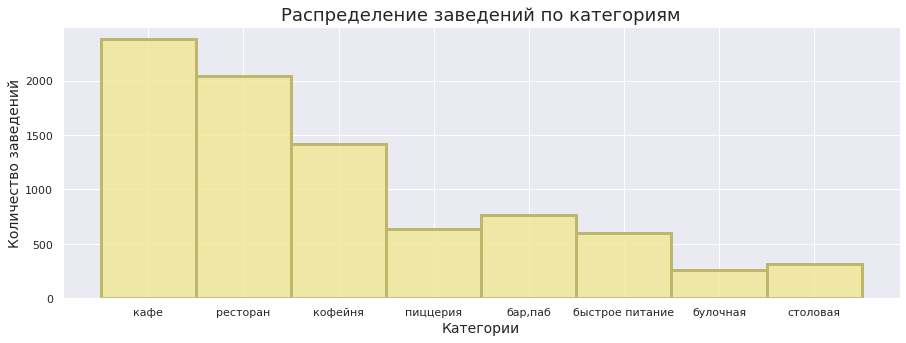

In [19]:
graf_ik('category','Категории','Распределение заведений по категориям')

#### 2.5.2. district
В данных все хорошо

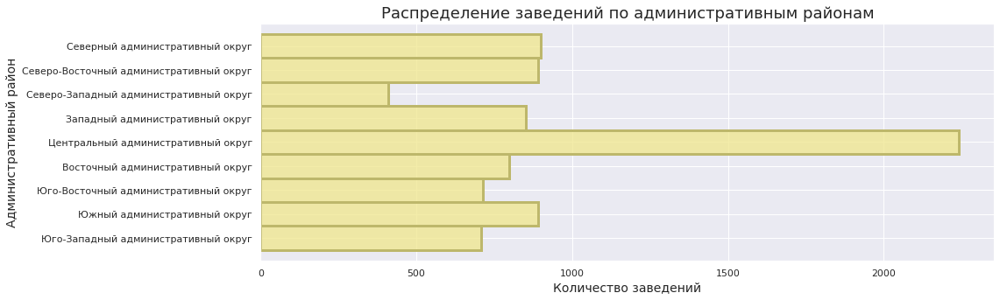

In [20]:
graf_ik('district','Административный район','Распределение заведений по административным районам',tr=True)

#### 2.5.3. price
В данных большое количество неизвестных без возможности восстановления  
Без учета неизвестных подборка подчиняется закону нормального распределения

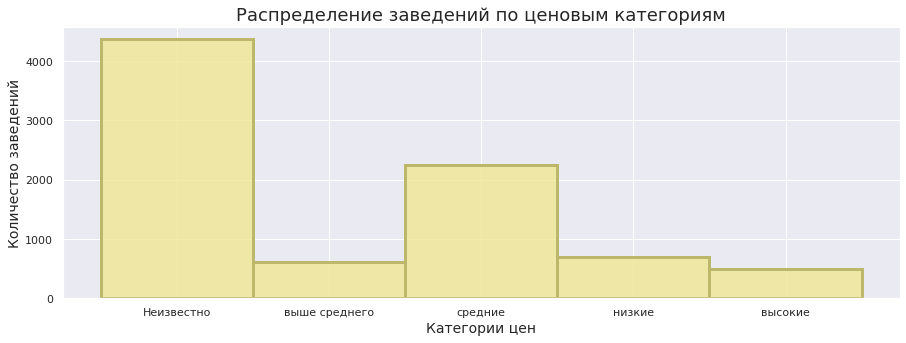

In [21]:
graf_ik('price','Категории цен','Распределение заведений по ценовым категориям')

#### 2.5.4. chain
В данных все хорошо

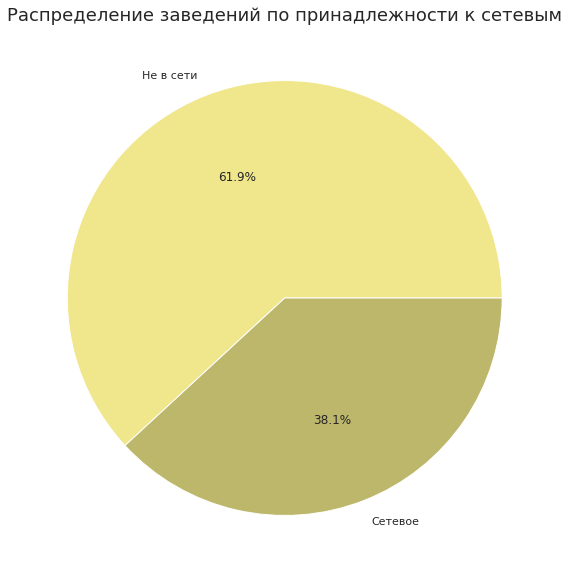

In [22]:
graf_ik_pie('Распределение заведений по принадлежности к сетевым',h=10,w=10)

### 2.6. Обработка количественных значений

In [23]:
def mappa(data=data):    
    plt.figure(figsize=(8,8))
    plt.scatter('lat','lng',color='Blue',data=data);
    plt.title('Распределение заведений по координатам',fontsize=18);
    plt.ylabel('Долгота',fontsize=14)
    plt.xlabel('Широта',fontsize=14)
    plt.grid(True)
    plt.show()

In [24]:
#Функция для обрезания красивых гистограмм
def graf_ik_mk2(a,x_lab,c,data=data,deg=0,tr=False,n=100,lng=100,sit=False):
    data_r = data.copy()
    # запишем нулевые строки(или отрицательные) в отдельный датафрейм
    if sit is True:
        data_empty = data.loc[data[a] == -1]
        data_f = data.loc[data[a] >= 0 ]
    else:
        data_empty = data.loc[data[a] == 0]
        data_f = data.loc[data[a] > 0 ]
    data = data_f.loc[(data_f[a] < np.percentile(data_f[a],n))]
    
    plt.figure(figsize=(15,12))
    plt.subplot(211)
    sns.histplot(data_f[a],
             color='khaki',
             ec="darkkhaki",
             bins=int(len(data[a].unique())*4),
             lw=1)
    plt.xlabel(x_lab,fontsize=14)
    plt.xticks(rotation=deg)
    plt.ylabel('Количество заведений',fontsize=14)
    plt.grid(True)
    plt.title(c,fontsize=18)
    plt.text(np.percentile(data_f[a],n)*1.2,lng, r'Отрезаем', verticalalignment='center')
    plt.axvline(np.percentile(data_f[a],n),color='r')
    
    plt.subplot(212)
    sns.histplot(data[a],
             color='khaki',
             ec="darkkhaki",
             bins=int(len(data[a].unique())*4),
             lw=3)
    plt.xlabel(x_lab,fontsize=14)
    plt.xticks(rotation=deg)
    plt.ylabel('Количество заведений',fontsize=14)
    plt.grid(True)
    plt.title(c,fontsize=18)
    #   Вернем нулевые строки
    data = pd.merge(data,data_empty,how='outer')
    print('На шаге потеряно',round (raznica(data_r,data,a), 2), '%')
    print('Граница обрезания(максимум) = ',round(max(data[a]),2))
    return(data)

def raznica(data_r,data,a):
    x = data_r[a].count()
    y = data[a].count()
    return(((x-y)/x)*100)

#### 2.5.1. lat и lng
Аномальных значений не наблюдается

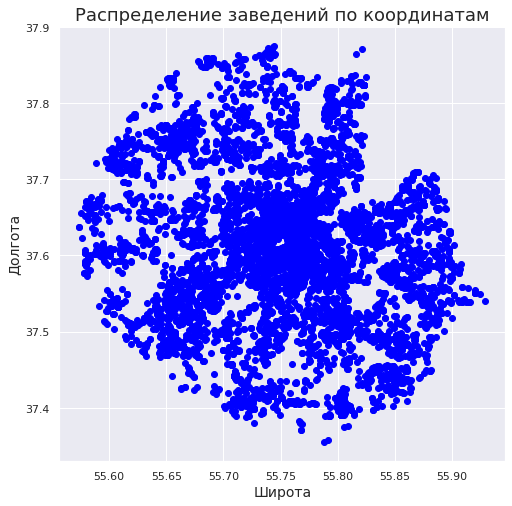

In [25]:
mappa()

#### 2.5.2. rating
Аномальных значений не наблюдается

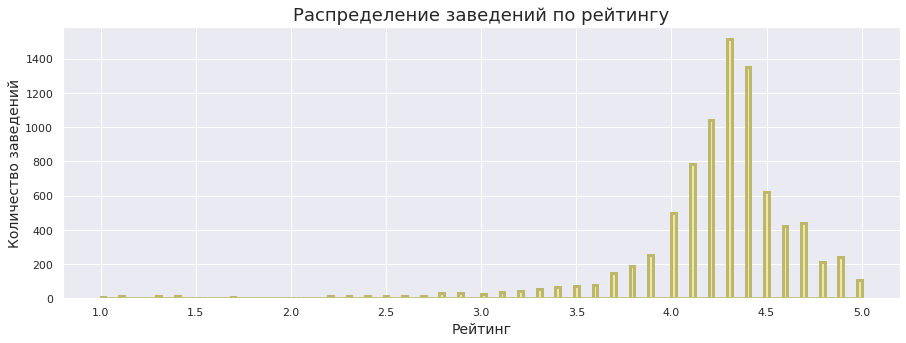

In [26]:
graf_ik('rating','Рейтинг','Распределение заведений по рейтингу')

#### 2.5.3. middle_avg_bill 
В данных большое количество неизвестных без возможности восстановления  
Без учета неизвестных подборка подчиняется закону нормального распределения

In [27]:
data_i.sort_values(by='middle_avg_bill', ascending=False).head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
7177,Кафе,ресторан,"Москва, Каширское шоссе, 23, стр. 2",Южный административный округ,"ежедневно, круглосуточно",55.657450,37.646665,4.1,высокие,Средний счёт:20000–50000 ₽,35000.0,NaN,0,100.0
730,Чойхона,"бар,паб","Москва, Дмитровское шоссе, 95А",Северный административный округ,"ежедневно, 10:00–23:00",55.871497,37.543555,4.4,высокие,Средний счёт:5000–17000 ₽,11000.0,NaN,0,49.0
5481,Гости,ресторан,"Москва, шоссе Энтузиастов, 52",Восточный административный округ,"пн,вс 18:00–22:30",55.759088,37.760570,4.1,высокие,Средний счёт:5000–15000 ₽,10000.0,NaN,0,NaN
3882,White Rabbit,ресторан,"Москва, Смоленская площадь, 3",Центральный административный округ,"ежедневно, 12:00–00:00",55.747608,37.581248,4.9,высокие,Средний счёт:7000–7500 ₽,7250.0,NaN,0,150.0
3487,800°с Contemporary Steak,ресторан,"Москва, Большой Патриарший переулок, 6, стр. 1",Центральный административный округ,"ежедневно, 09:00–23:30",55.762708,37.592138,4.7,высокие,Средний счёт:6000–8000 ₽,7000.0,NaN,0,75.0


На шаге потеряно 0.05 %
Граница обрезания(максимум) =  7000.0


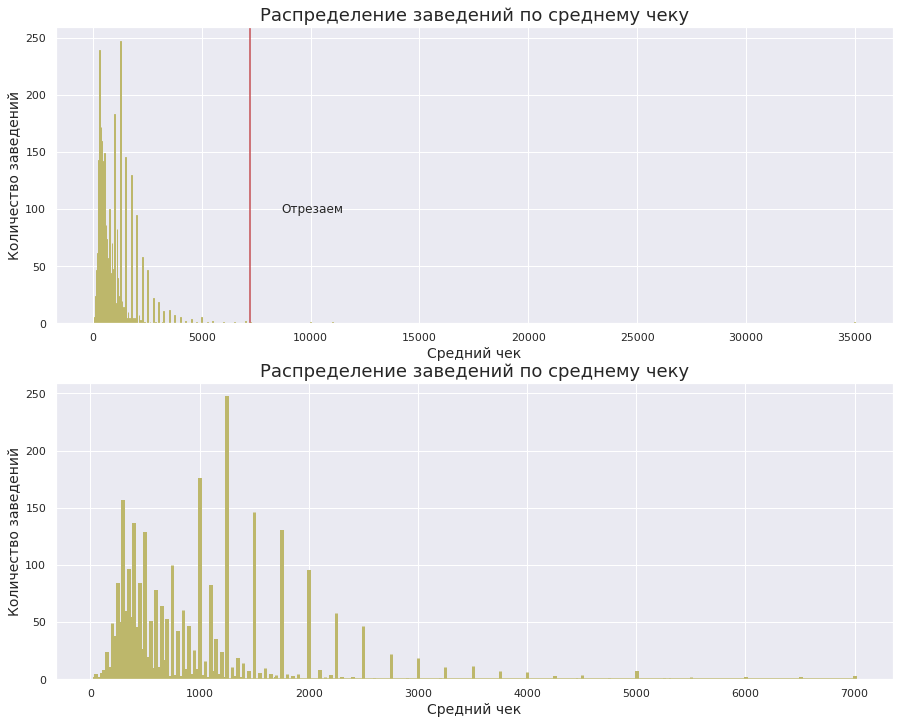

In [28]:
data = graf_ik_mk2('middle_avg_bill','Средний чек','Распределение заведений по среднему чеку',n=99.9);

#### 2.5.4. middle_coffee_cup
В данных большое количество неизвестных без возможности восстановления  
Без учета неизвестных подборка подчиняется закону нормального распределения

На шаге потеряно 0.01 %
Граница обрезания(максимум) =  375.0


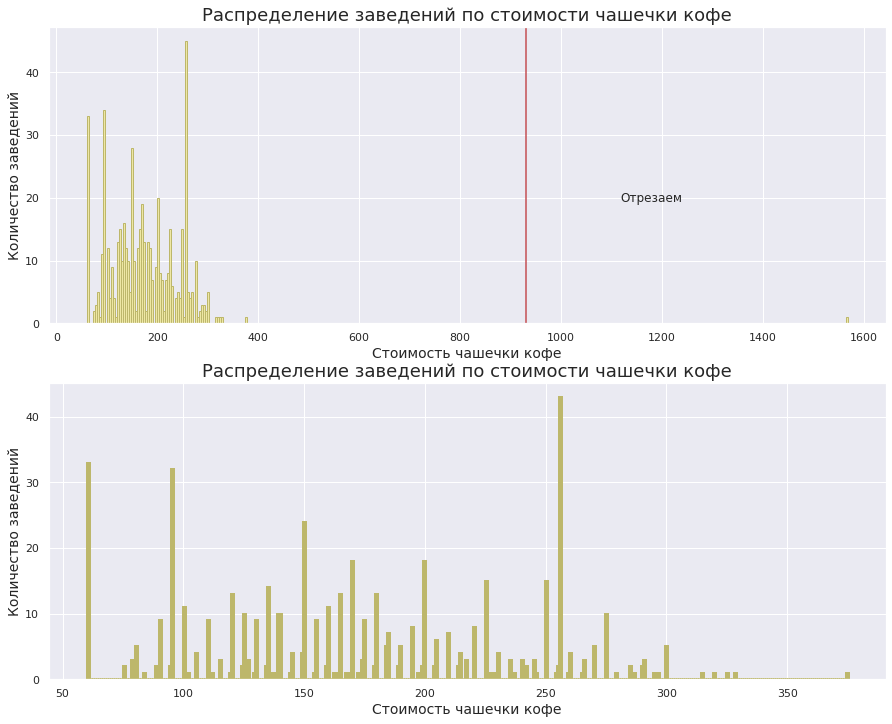

In [29]:
data = graf_ik_mk2('middle_coffee_cup',
            'Стоимость чашечки кофе',
            'Распределение заведений по стоимости чашечки кофе',
            n=99.9, lng=20);

#### 2.5.5. seats
В данных большое количество неизвестных без возможности восстановления  
Без учета неизвестных подборка подчиняется закону нормального распределения

На шаге потеряно 0.33 %
Граница обрезания(максимум) =  644


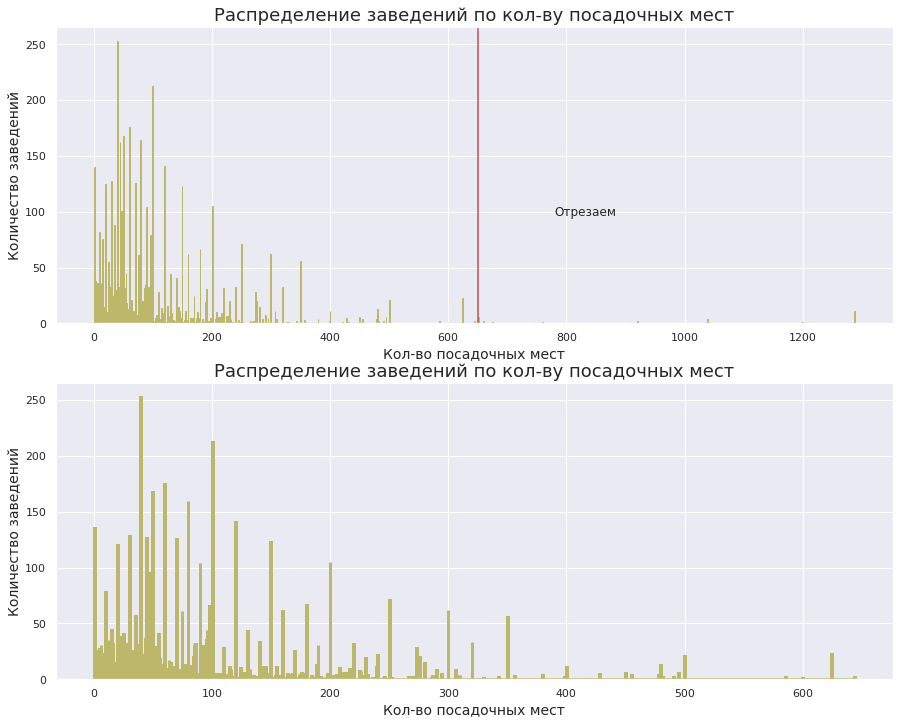

In [30]:
data = graf_ik_mk2('seats',
            'Кол-во посадочных мест',
            'Распределение заведений по кол-ву посадочных мест',
            n=99.5, lng=100,sit=True);

### 2.7. Добавление новых столбцов

In [31]:
def cut_str(data):
    streets = data.replace('Москва, ', '').split(',')[0]
    streets = streets.split(',')[0]    
    return(streets)

#### 2.7.1 street

In [32]:
data['street'] = data['address'].apply(cut_str)
data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,0.0,0,4,улица Дыбенко
1,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,0.0,0,45,Клязьминская улица
2,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,0.0,1,148,Правобережная улица
3,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,0.0,0,45,Клязьминская улица
4,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,0.0,0,45,Клязьминская улица


#### 2.7.2 is_24/7

In [33]:
def is_24_7(data):
    if 'ежедневно, круглосуточно' in data:
        return(True)
    else:
        return(False)

In [34]:
data['is_24/7'] = data['hours'].apply(is_24_7)
data.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,0.0,0,4,улица Дыбенко,False
1,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,0.0,0,45,Клязьминская улица,False
2,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,0.0,1,148,Правобережная улица,False
3,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,0.0,0,45,Клязьминская улица,False
4,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,0.0,0,45,Клязьминская улица,False
5,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,0.0,0,79,Дмитровское шоссе,False
6,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,0.0,0,65,Ангарская улица,False
7,Great Room Bar,"бар,паб","Москва, Левобережная улица, 12",Северный административный округ,"ежедневно, круглосуточно",55.877832,37.469171,4.5,средние,Цена бокала пива:250–350 ₽,0.0,0.0,0,102,Левобережная улица,True
8,Буханка,булочная,"Москва, Базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.877007,37.504980,4.8,Неизвестно,0,0.0,0.0,1,180,Базовская улица,False
9,Дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,0.0,0,180,улица Бусиновская Горка,False


### 2.8. Итоги предобработки

На __этапе предобработки__ были проведены следующие манипуляции с исходными данными:
- Обработы пропуски  
    - Там, где пропуски невозможно было восстановить, были использованы заглушки, выходящие за интервал нормальных значений для каждого из столбцов
- Проверены типы данных
- Обработаны явные и неявные дубликаты
- Обработаны категориальные значения
- Обработаны количественные значения
- Добавлены новые столбцы 
    - ___street___ с названием улицы
    - ___is_24/7___ отражает работы заведения ежедневно в круглосуточном режиме

In [35]:
# Общие потери
print('Количество данных сократилось на',round(raznica(data_i,data,'name'),2),'%')

Количество данных сократилось на 0.33 %


## 3. Анализ данных

### 3.1. Связь категорий и количества заведений

In [36]:
def bar_plot(data,y='name',x='count',title='Численность сетевых заведений в регионе',\
             xlabel='Количество заведений', ylabel='Название сети',\
             ylim=False,y_min=0,y_max=1,w=12,h=8):
    plt.figure(figsize=(w,h))
    sns.barplot(y=data[y], x=data[x], data=data, palette=['#F0E68C','#bdb76b'])
    plt.title(title,fontsize=18);
    plt.xlabel(xlabel,fontsize=14)
    plt.ylabel(ylabel,fontsize=14)
    if ylim is True:
        plt.ylim([y_min,y_max])
    plt.show()

In [37]:
def ad_graf_ik_pie(a,c,data=data,h=10,w=15):
    data_x = data[a].unique()
    data_p=[]
    for category in data_x:
        data_p.append(len(data[data[a] == category]))
    labels = data_x
    plt.figure(figsize=(w,h))

    plt.pie(x=data_p,labels=labels, autopct='%1.1f%%',colors=['khaki','darkkhaki'],textprops={'fontsize': 14})

    plt.title(c,fontsize=18)

    plt.show()

In [38]:
def count_plot(data=data,a='category',hue='chain'):
    plt.figure(figsize=(15,5))
    sns.countplot(x=a,hue=hue, data=data, palette=['#F0E68C','#bdb76b'])
    plt.title('Связь между категорией и количеством заведений (сетевых и не в сети)',fontsize=18);
    plt.ylabel('Количество заведений',fontsize=14)
    plt.xlabel('Категория заведения',fontsize=14)
    plt.legend(title='Отношение к сетям', labels=['Не в сети','Сетевое'])
    plt.show()

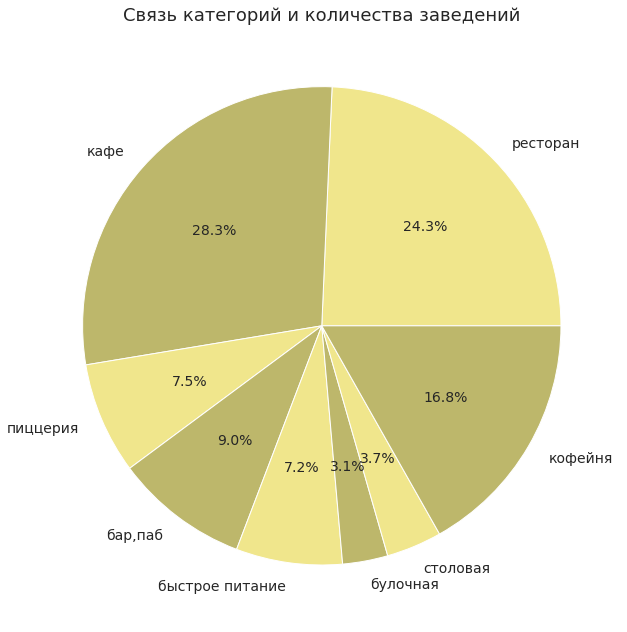

In [39]:
ad_graf_ik_pie('category','Связь категорий и количества заведений',h=11,w=11)

In [40]:
def count_plot_order(data=data,x='category',order=data['category'].value_counts().index):
    plt.figure(figsize=(12,9))
    sns.countplot(x=x, data=data,\
                  palette=['#F0E68C','#bdb76b'],
                  order=order)
    plt.title('Связь между категорией и количеством заведений',fontsize=18);
    plt.ylabel('Количество заведений',fontsize=14)
    plt.xlabel('Категория заведения',fontsize=14)
    plt.show()

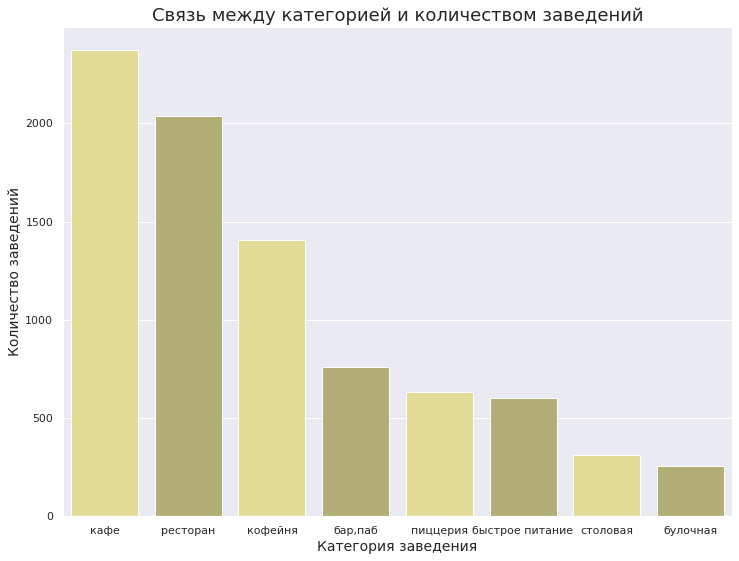

In [41]:
count_plot_order()

- Большинство (около 70%) заведений являются либо рестораном, либо кафе или кофейней
- Самыми малочислеными являются булочные и столовые (около 7%)

### 3.2. Связь категорий и количества мест в заведениях

In [42]:
def violin_plot(data=data,f=max(data['seats'])):
    # Исключим отрицательные значения
    data_v = data[data['seats'] >= 0]
    plt.figure(figsize=(15,5))
#   Добавим переменную для сортировки значений на графике
    order = data_v.groupby(by=['category'])['seats'].median().sort_values()[::-1].index
#     ranks = planets.groupby("method")["distance"].mean().fillna(0).sort_values()[::-1].index
    sns.violinplot(data=data_v, x='category', y='seats',order=order)
    plt.title('Связь между категорией и количеством посадочных мест в заведении',fontsize=18);
    plt.ylabel('Количество посадочных мест',fontsize=14)
    plt.xlabel('Категория заведения',fontsize=14)
    plt.ylim([-50,f])
    plt.show()

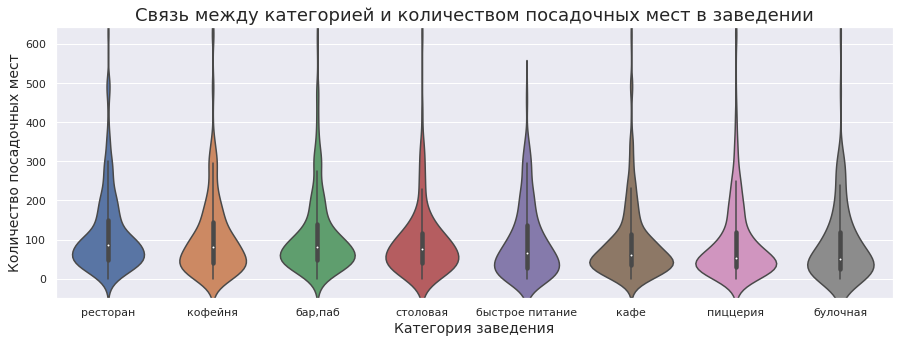

In [43]:
violin_plot()

Данная диаграмма имеет слишком общий вид, посмотрим на категории в пределах до 200 посадочных мест

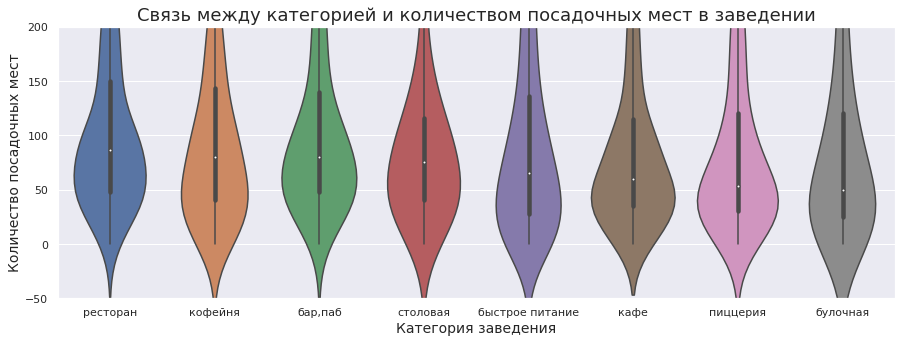

In [44]:
violin_plot(f=200)

Можно смело заявить, что:
- В большинстве своем обычно в ресторанах,кофейнях, барах и пабах больше мест относительно остальных категорий
- Минимальное количество мест в заведениях быстрого питания

### 3.3. Сетевые и несетевые места

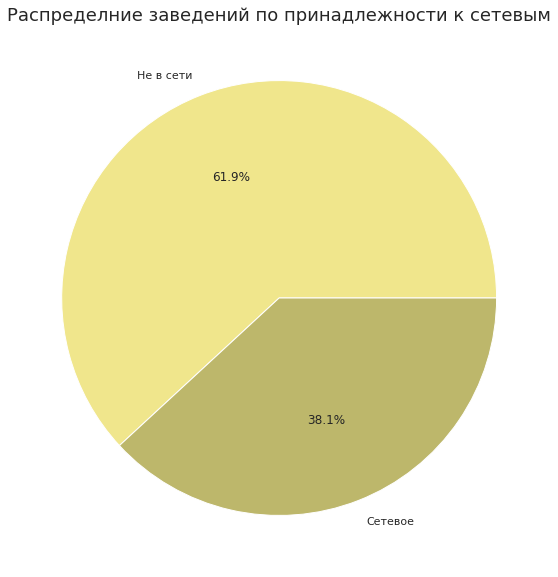

In [45]:
graf_ik_pie('Распределние заведений по принадлежности к сетевым',h=10,w=10)

Больше половины заведений - не часть сети!

### 3.4. Самая сетевая категория

Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.

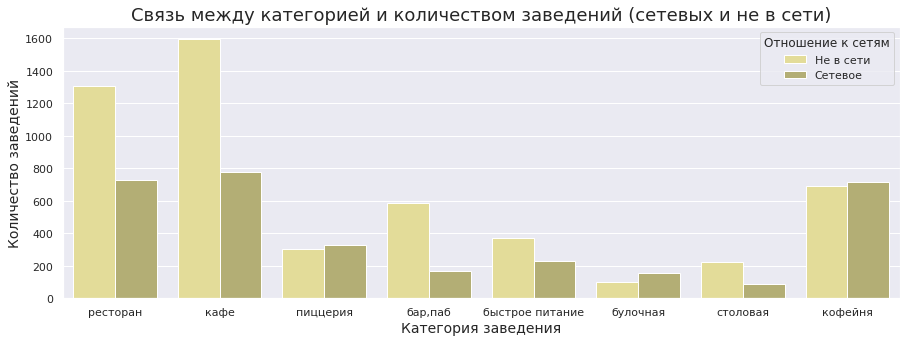

In [46]:
count_plot()

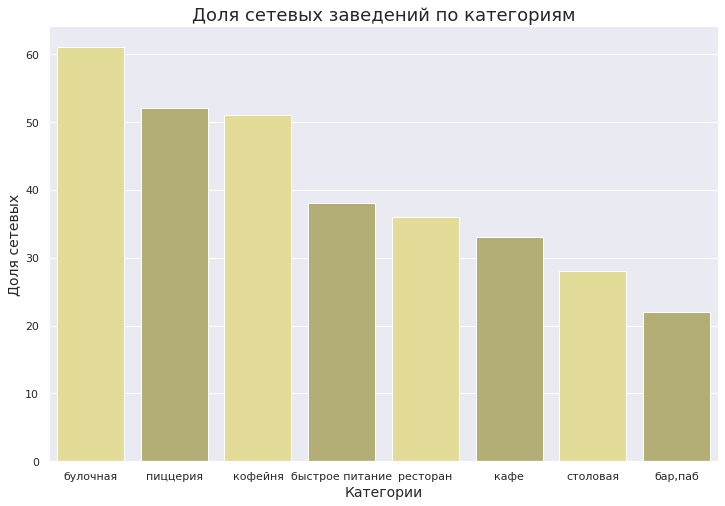

In [47]:
# Подготовка датасета
data_1 = data.pivot_table(values='name', index='category',columns='chain',\
                                aggfunc='count').reset_index()
data_1['01']=round(data_1[1]*100/(data_1[0]+data_1[1]),0)
# Сортировка
data_1 = data_1.sort_values(by='01',ascending=False)

bar_plot(data_1,y='01',x='category',title='Доля сетевых заведений по категориям',\
             xlabel='Категории', ylabel='Доля сетевых',\
             ylim=False,y_min=0,y_max=1)


Чаще всего сетевыми являются булочные

### 3.5. Популярные сети

Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?

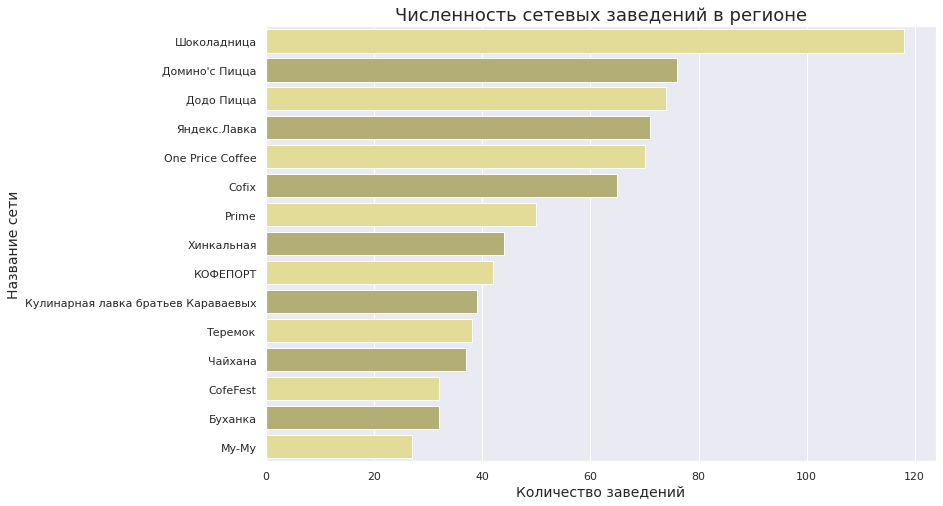

In [48]:
data_web = data[data['chain'] == 1]
data_web_gr = data_web.groupby('name').size().reset_index(name='count')
data_web_top = data_web_gr.sort_values(by='count',ascending=False).head(15)
bar_plot(data_web_top)

С довольно большим отрывом побеждает Шоколадница!  

Это все __не очень дорогие(из средней ценовой категории)__ заведения и сервисы(как Лавка),   которые позволяют довольно __быстро утолить свой голод__ или потребность в кофе.  
В основным это __кафе, пицерии и кофейни__

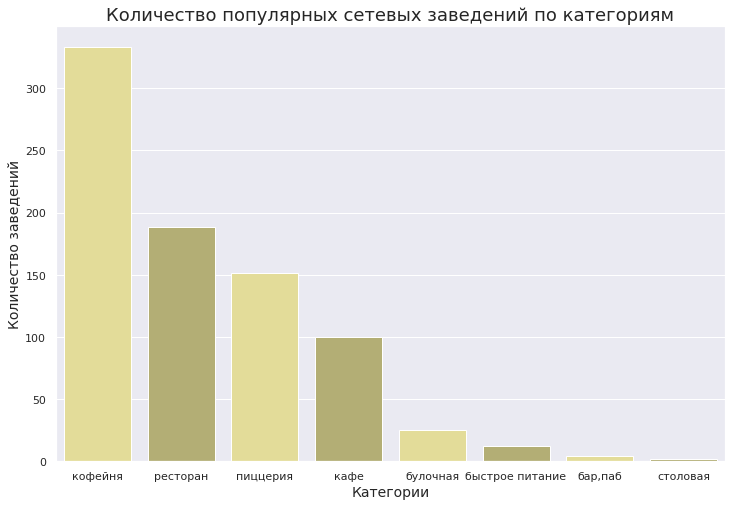

In [49]:
# создаем сводную таблицу для нахождения названий сетей
data_web_2 = data_web.pivot_table(values='seats',index='name',aggfunc='count').\
                                reset_index().\
                                sort_values(by='seats',ascending=False).\
                                head(15)
# С помощью вышеописанной таблицы отбираем такие заведения
data_web3 = data.loc[data['name'].isin(data_web_2['name'].tolist())]
# Создаем сводную таблицу с категориями
data_web15 = data_web3.pivot_table(values='seats',index='category',aggfunc='count').\
                                reset_index().\
                                sort_values(by='seats',ascending=False)
# Строим график
bar_plot(data_web15,y='seats',x='category',title='Количество популярных сетевых заведений по категориям',\
             xlabel='Категории', ylabel='Количество заведений',\
             ylim=False,y_min=0,y_max=1)

### 3.6. Административные районы

Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [50]:
def double_count_plot(y='district',hue='category',data=data,\
                     title='Связь между районом и количеством и категориями заведений',\
                     ylabel='Административные районы',xlabel='Категория заведения',
                     legend='Категория заведения'):
    order=data[y].value_counts().index
    plt.figure(figsize=(6,10))
    sns.countplot(y=y,hue=hue, data=data,order=order)
    sns.countplot(y=y, data=data,alpha = 0.45,order=order)
    plt.title(title,fontsize=18);
    plt.ylabel(ylabel,fontsize=14)
    plt.xlabel(xlabel,fontsize=14)
    plt.legend(title=legend)
    plt.show()

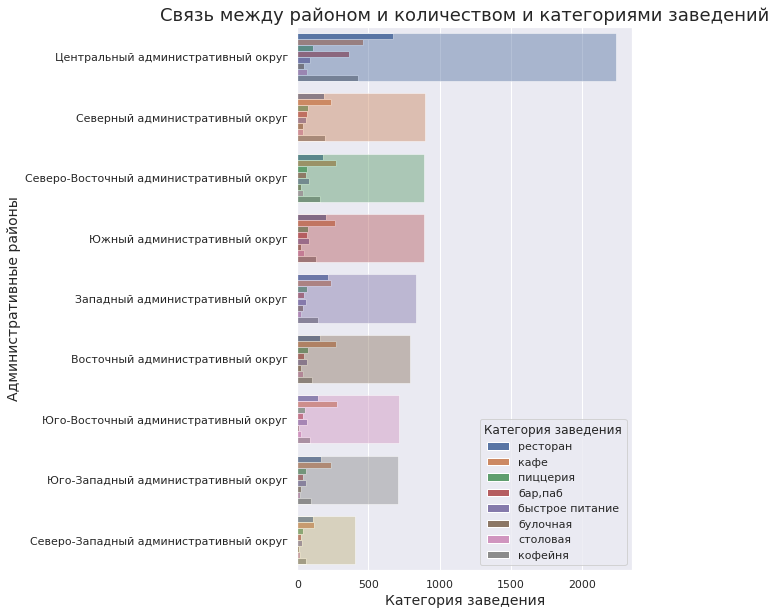

In [51]:
double_count_plot()

Абсолютным __чемпионом__ как по общему количеству, так и по количеству в отдельных категориях __является Центральный административный округ__ (что на самом деле довольно предсказуемо, т.к. это центр не только города но и туризма, прогулок и прочих активностей, при которых у людей будет больше потребностей в еде или напитках, чем в типовых спальных районах. Плюс публика более платежеспособная)

### 3.7. Средний рейтинг

Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

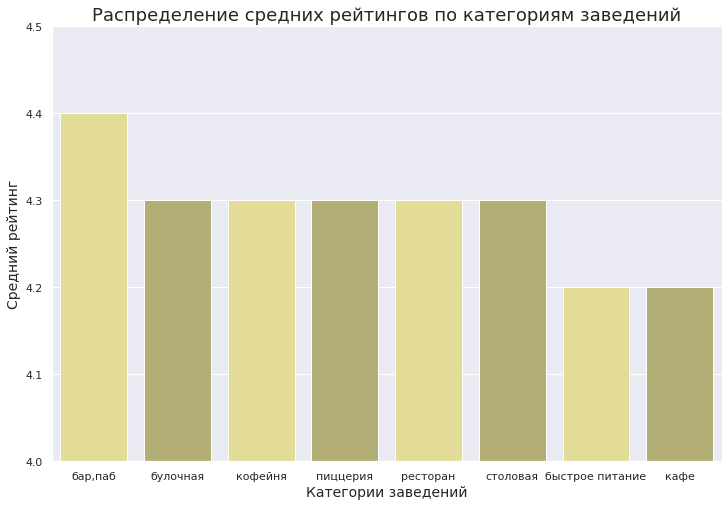

In [52]:
data_rate = data.pivot_table(values='rating', index='category', aggfunc='median').reset_index().\
                            sort_values(by='rating',ascending=False)

bar_plot(data_rate,y='rating',x='category',\
         title='Распределение средних рейтингов по категориям заведений',\
         xlabel='Категории заведений', ylabel='Средний рейтинг',\
         ylim=True,y_min=4,y_max=4.5)


Можно сделать вывод, что средний рейтинг от категории к категории почти не различаются.
- Самый высокий рейтинг (4.4) имеют __бары и пабы__
- Самый низкий - __быстрое питание и кафе__

### 3.8. Средний рейтинг заведений каждого района

Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы)

In [53]:
def karta(data,a='district',b='name',c='Количество кофеен по районам'):
    # загружаем JSON-файл с границами округов Москвы
    state_geo = '/datasets/admin_level_geomap.geojson'
    # moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
    moscow_lat, moscow_lng = 55.751244, 37.618423

    # создаём карту Москвы
    m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

    # создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
    Choropleth(
        geo_data=state_geo,
        data=data,
        columns=[a, b],
        key_on='feature.name',
        fill_color='YlGn',
        fill_opacity=0.8,
        legend_name=c,
    ).add_to(m)

    # выводим карту
    return(m)

In [54]:
data_dist_rate = data.pivot_table(values='rating', index='district', aggfunc='mean').reset_index()
karta(data_dist_rate,b='rating',c='Средний рейтинг заведений по районам')

При взгляде на хороплет становится явным главенство центрального района

### 3.9. Хороплет и все заведения

Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [55]:
# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
    

In [56]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

Вывод совпадает с выводом п 3.6.  
В Центральном районе больше всего заведений

### 3.10. Топ-15 улиц по количеству заведений

Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [57]:
data_streets_top = data.pivot_table(values='name', index='street',\
                                aggfunc='count').reset_index().sort_values(by='name',ascending=False).head(15)
data_streets = data.loc[data['street'].isin(data_streets_top['street'].tolist())]

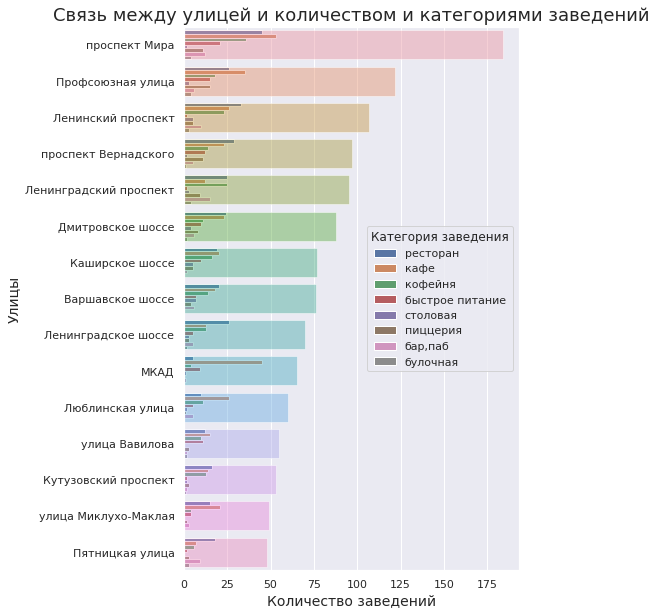

In [58]:
double_count_plot(y='street',hue='category',data=data_streets,\
                     title='Связь между улицей и количеством и категориями заведений',\
                     ylabel='Улицы',xlabel='Количество заведений',
                     legend='Категория заведения')

Можно увидеть, что самой популярной для заведений улицей является __Проспект Мира__!

### 3.11. Улицы с одним заведением

Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [59]:
data_streets_down = data.pivot_table(values='name', index='street',\
                                aggfunc='count').reset_index().sort_values(by='name')
data_streets_down = data_streets_down.loc[data_streets_down['name'] == 1]
data_streets_down = data.loc[data['street'].isin(data_streets_down['street'].tolist())]
data_streets_down

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
9,Дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,0.0,0,180,улица Бусиновская Горка,False
59,Алазани,ресторан,"Москва, Челобитьевское шоссе, 10А",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.914074,37.556803,4.3,выше среднего,Средний счёт:600–2000 ₽,1300.0,0.0,0,40,Челобитьевское шоссе,False
63,Алло! Пицца,пиццерия,"Москва, Костромская улица, 14Б",Северо-Восточный административный округ,"ежедневно, 10:00–23:00",55.884819,37.598559,4.3,средние,Средний счёт:500–700 ₽,600.0,0.0,1,240,Костромская улица,False
98,Арамье,булочная,"Москва, улица 800-летия Москвы, 22, корп. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.879392,37.556832,4.0,Неизвестно,0,0.0,0.0,1,0,улица 800-летия Москвы,False
160,Светлана,кафе,"Москва, Таёжная улица, 1",Северо-Восточный административный округ,Неизвестно,55.880857,37.700663,4.1,Неизвестно,0,0.0,0.0,0,45,Таёжная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8273,Речниковъ,ресторан,"Москва, улица Речников, 21, стр. 10",Южный административный округ,"ежедневно, 12:00–00:00",55.679219,37.690417,4.3,Неизвестно,0,0.0,0.0,0,-1,улица Речников,False
8297,БонАрхитект,ресторан,"Москва, 1-й Щипковский переулок, 4",Южный административный округ,"ежедневно, 10:00–18:00",55.722235,37.633463,4.0,Неизвестно,0,0.0,0.0,0,-1,1-й Щипковский переулок,False
8302,Di villaggio,кафе,"Москва, парк Тюфелева роща",Южный административный округ,"ежедневно, 12:00–21:00",55.697915,37.641741,3.3,Неизвестно,0,0.0,0.0,0,-1,парк Тюфелева роща,False
8324,WTFcoffee,кофейня,"Москва, улица Артюхиной, 14/8с1",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.699044,37.737790,4.4,средние,0,0.0,0.0,0,-1,улица Артюхиной,False


In [60]:
data_streets_down_m = data_streets_down.pivot_table(values='name', index='district', aggfunc='count').reset_index()

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# применяем функцию create_clusters() к каждой строке датафрейма
data_streets_down.apply(create_clusters, axis=1)

# выводим карту
m

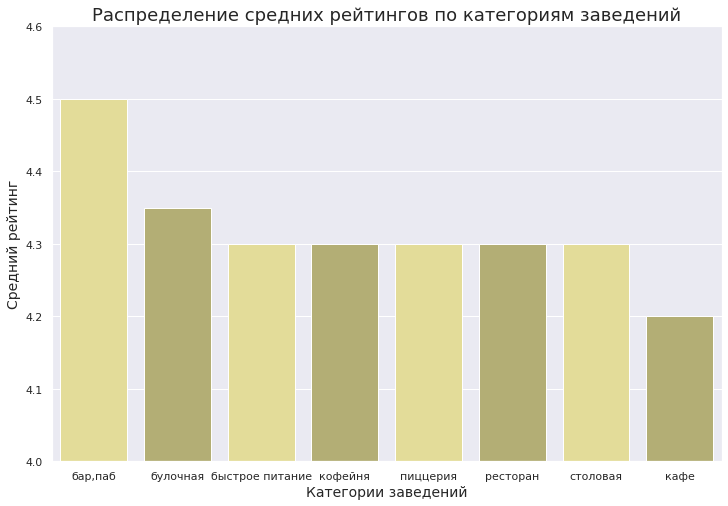

In [61]:
data_streets_down_r = data_streets_down.pivot_table(values='rating', index='category', aggfunc='median').\
                                                    reset_index().\
                                                    sort_values(by='rating',ascending=False)

bar_plot(data_streets_down_r,y='rating',x='category',\
         title='Распределение средних рейтингов по категориям заведений',\
         xlabel='Категории заведений', ylabel='Средний рейтинг',\
         ylim=True,y_min=4,y_max=4.6)

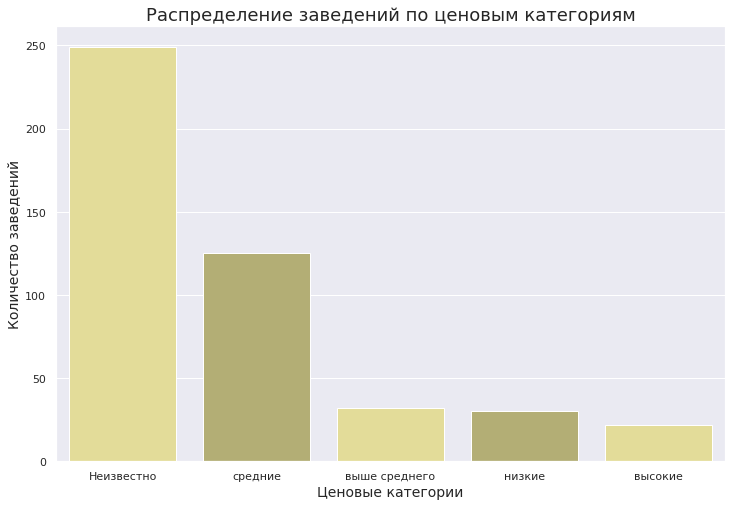

In [62]:
data_streets_down_p = data_streets_down.pivot_table(values='name', index='price', aggfunc='count').\
                                                    reset_index().\
                                                    sort_values(by='name',ascending=False)

bar_plot(data_streets_down_p,y='name',x='price',\
         title='Распределение заведений по ценовым категориям',\
         xlabel='Ценовые категории', ylabel='Количество заведений',\
         ylim=False,y_min=4,y_max=4.8)


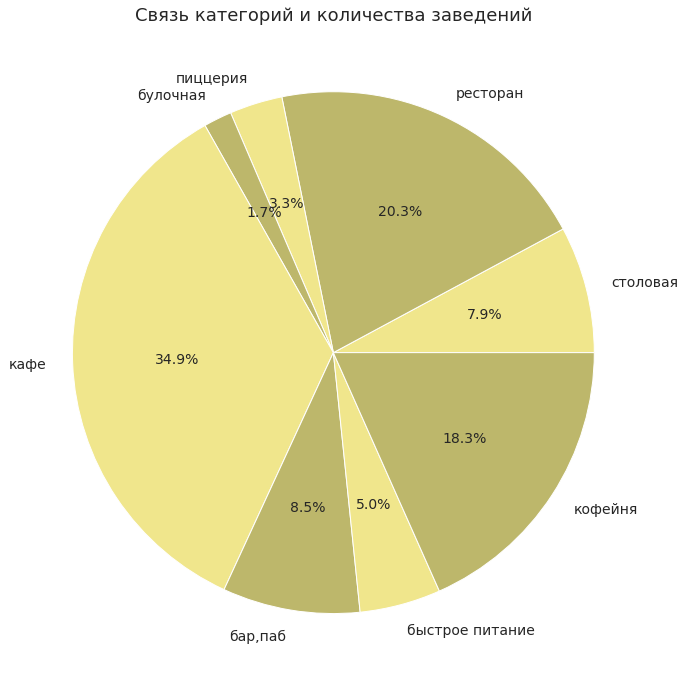

In [63]:
ad_graf_ik_pie('category','Связь категорий и количества заведений',h=12,w=12,data=data_streets_down)

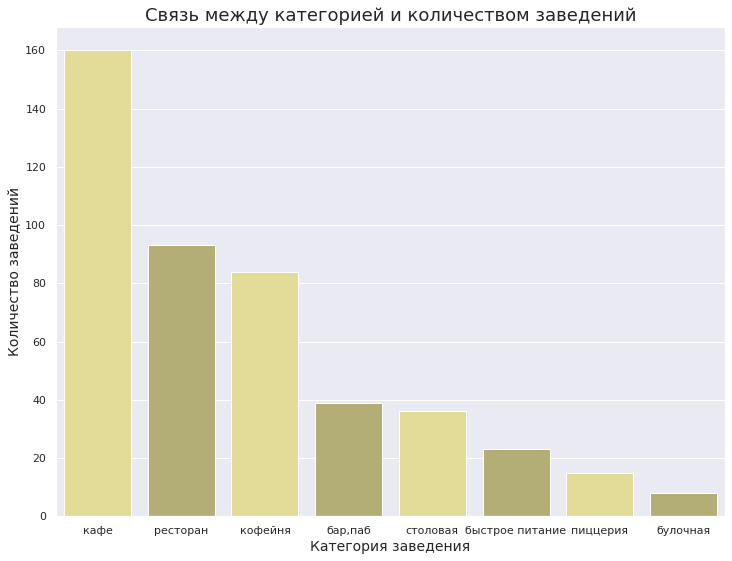

In [64]:
count_plot_order(data=data_streets_down,order=data_streets_down['category'].value_counts().index)

Заведения, являющимися единственными на улице, __не сильно отличаются__ от общей массы заведений:
- Чаще всего расположены в центре
- Самые популярные категории - кафе,ресторан и кофейня
- Самое многочисленная ценовая категория - средняя  
Но есть и небольшие __особенности__:
- Кафе тут занимают больше трети от общего числа
- Средний рейтинг у баров и пабов выше на 0.1

### 3.12. Средний чек

In [65]:
# В данном блоке не будем рассматривать заведения с заглушкой-нулем
data_price=data.query('middle_avg_bill > 0')
data_price = data_price.pivot_table(values='middle_avg_bill', index='district', aggfunc='median').reset_index()

karta(data_price,b='middle_avg_bill',c='Средний чек заведений по районам')

- Центр и западная часть Москвы - самые дорогие части города
- Северная и юго-восточная части - самые дешевые (скорее всего из за обилия спальных районов)
- Можно также отдельно отметить, что при отдалении от центра будет снижаться и сумма среднего чека

### 3.13. Итоги анализа

Настало время подвести итоги анализа:

- Самыми попурярными категориями являются __кафе, ресторан и кофейня__
    - Самые универсальные и разнообразные виды заведений
- Самое большое количество посадочных мест - в __ресторанах, барах и столовых__. 
    - Вообще без посадочных мест это виды заведений невозможно представить
- Большинство(около 62%) заведений - несетевые
- Большая, чем у остальных категорий, доля заведений булочных и кофеен являются сетевыми
- Большее количество(как суммарно, так и в каждой категории заведений) находится в __Центральном округе__
- В целом средний рейтинг заведений - __4.2__
    - Рейтинг каждой из категорий может отличаться от в интервале от -0.1 до 0.1
- Самый высокий средний рейтинг у заведений в Центральном округе
- Самая густонаселенная в плане общепита улица - __Проспект Мира__
- Существуют заведения-одиночки на своей улице
    - Они мало чем отличаются от большинства, единственное, рейтинг баров из таких заведений в среднем выше на 0.1
- __Самый высокий средний чек__ - в центральной и западной частях города
- __Самый низкий__ - в северной и юго-восточной

Можно сказать, что __если вы хотите преуспеть в общепите__, то желательно __открывать ресторан в центре или в западной частях Москвы__. Это конечно, не сможет точно гарантировать высокие продажи и рейтинги, но вероятность этого выше, чем при других вводных.

## 4. Открытие кофейни

### 4.1. Особенности расположения

Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [66]:
data_coffee = data[data['category'] == 'кофейня']
print('Всего в датасете',len(data_coffee),'кофеен')

Всего в датасете 1408 кофеен


In [67]:
data_coffee_m = data_coffee.pivot_table(values='name', index='district', aggfunc='count').reset_index()

display(data_coffee_m.sort_values(by='name',ascending=False))
karta(data_coffee_m)

,district,name
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,146
8,Южный административный округ,131
0,Восточный административный округ,104
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


Особенность расположения заключается в том, что кофени в основном расположены в центральной и северной частях города. 

### 4.2. Круглосуточные кофейни

Есть ли круглосуточные кофейни?

In [68]:
data_coffee_247 = data_coffee[data_coffee['is_24/7'] == True]
data_coffee_247_m = data_coffee_247.pivot_table(values='name', index='district', aggfunc='count').reset_index()
print('Количество круглосуточных кофеенн =',len(data_coffee_247))
print('Их доля от общего числа кофеенн =',round(2),'%')


Количество круглосуточных кофеенн = 59
Их доля от общего числа кофеенн = 2 %


Да, они существуют.  
Посмотрим на особенность расположения:

In [69]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# применяем функцию create_clusters() к каждой строке датафрейма
data_coffee_247.apply(create_clusters, axis=1)

# выводим карту
m

In [70]:
karta(data_coffee_247_m)

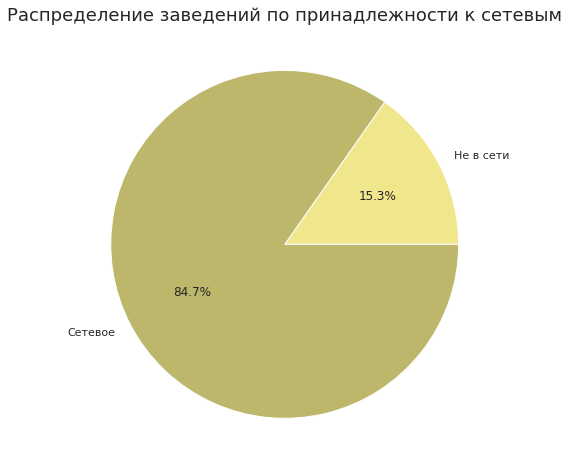

In [71]:
graf_ik_pie('Распределение заведений по принадлежности к сетевым',data=data_coffee_247,h=8,w=8)

- Круглосуточные кофейни расположены в основном опять же в центральной части  
- В своем большинстве (около 85%) это сетевые места

### 4.3. Рейтинги кофеен

Какие у кофеен рейтинги? Как они распределяются по районам?

In [72]:
data_coffee_rate = data_coffee.pivot_table(values='rating',\
                                  index='district',\
                                  aggfunc='mean').reset_index()
karta(data_coffee_rate,b='rating',c='Средний рейтинг кофеен по районам')

В среднем у кофеен рейтинг между 4.2 и 4.3 (в Западном и Северо-Восточном округах рейтинг ниже в среднем по городу)

### 4.4. Стоимость чашечки капучино

На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

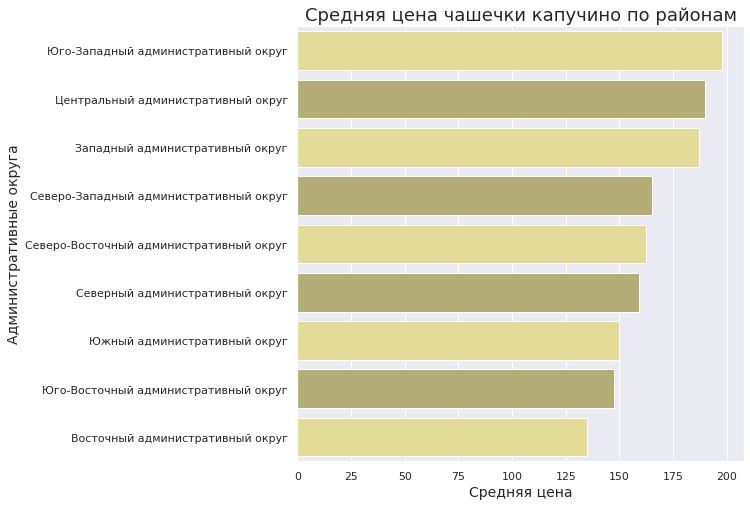

In [73]:
data_coffee_cup = data_coffee[data_coffee['middle_coffee_cup'] > 0]
data_coffee_cup = data_coffee_cup.pivot_table(values='middle_coffee_cup',\
                                              index='district',\
                                              aggfunc='median').reset_index().\
                                              sort_values(by='middle_coffee_cup',ascending=False)

bar_plot(data_coffee_cup,x='middle_coffee_cup',y='district',\
         title='Средняя цена чашечки капучино по районам',\
         ylabel='Административные округа', xlabel='Средняя цена',\
         ylim=False,y_min=4,y_max=4.8,w=8)

При открытии цена чашечки капучино должна быть на 10-15% ниже чем она есть в среднем по району.  
Если мы рассматриваем открытие в Центральном районе, то она должна быть 170-180 рублей.

### 4.5. Итоги анализа

- Большинство кофеен расположены в центре и на севере Москвы
- Круглосуточные кофени существуют
    - От общего числа кофеен это 4.2%
    - В основном они сетевые
- Средний рейтинг кофейни 4.2 - 4.3
    - В Западном и Северо-Восточном округах средний рейтинг немного ниже
- Стоит ориентироваться на стомость чашечки кофе ниже средней по району на 10% для быстрого привлечения аудитории

В итоге можно предоставить следующие __рекомендации__:
- Количество кофеен в центре слишком высоко, для первой точки сети лушче открыться на территории с меньшей конкуренцией - юго-запад Москвы(Хамовники).
- Желательно обеспечить круглосуточную работу кофейни, т.к. в рассматриваемом районе почти нет кофеен такого типа
- Средний рейтинг в Юго-Западном округе совпадает со средним рейтингом центра(территория не будет влиять на рейтинг)
- Средняя цена чашечки даже с 10% снижением будет довольно высокой - 180 рублей

## 5. Презентация

Презентация: https://disk.yandex.ru/i/daIaKbjsMD_C5g